In [3]:
import os
import numpy as np
import cv2
from matplotlib import pyplot as plt

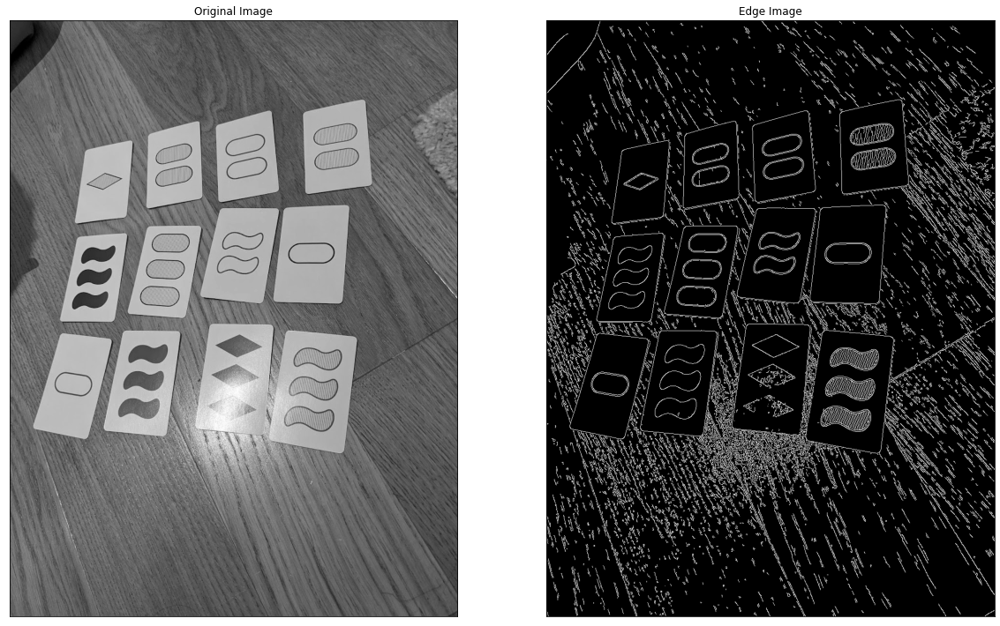

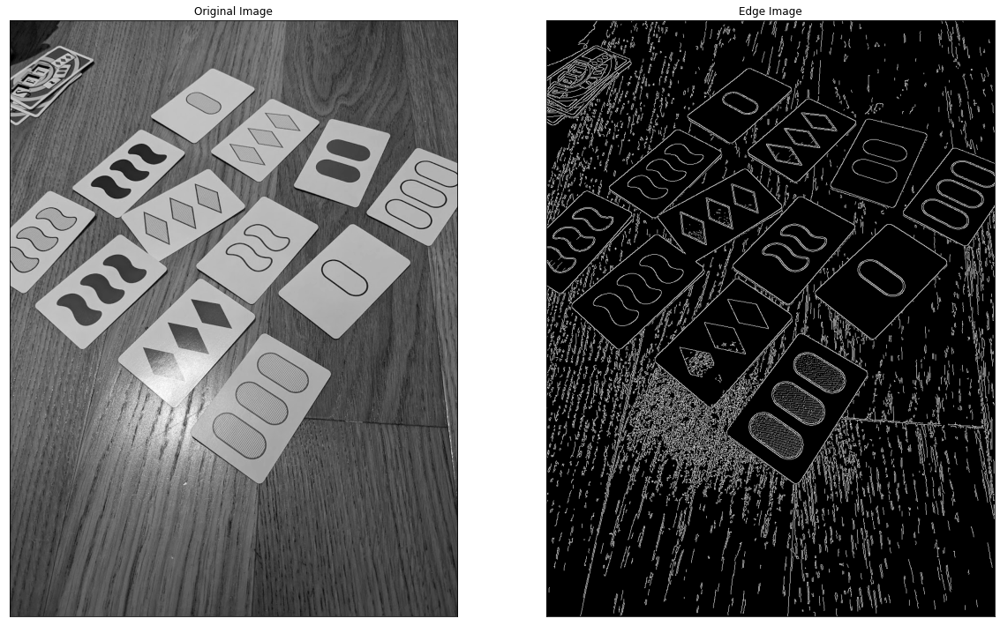

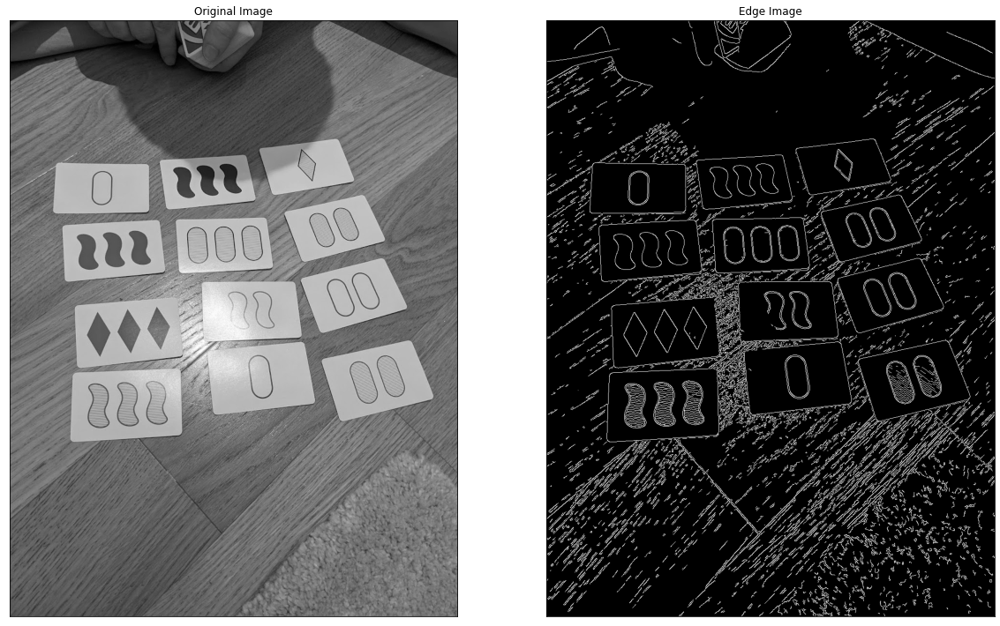

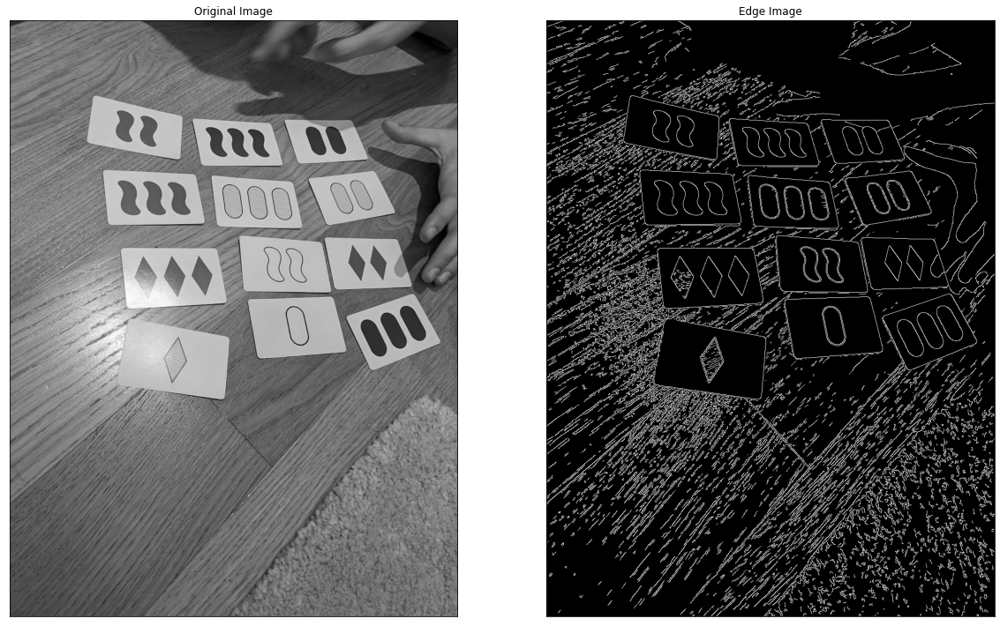

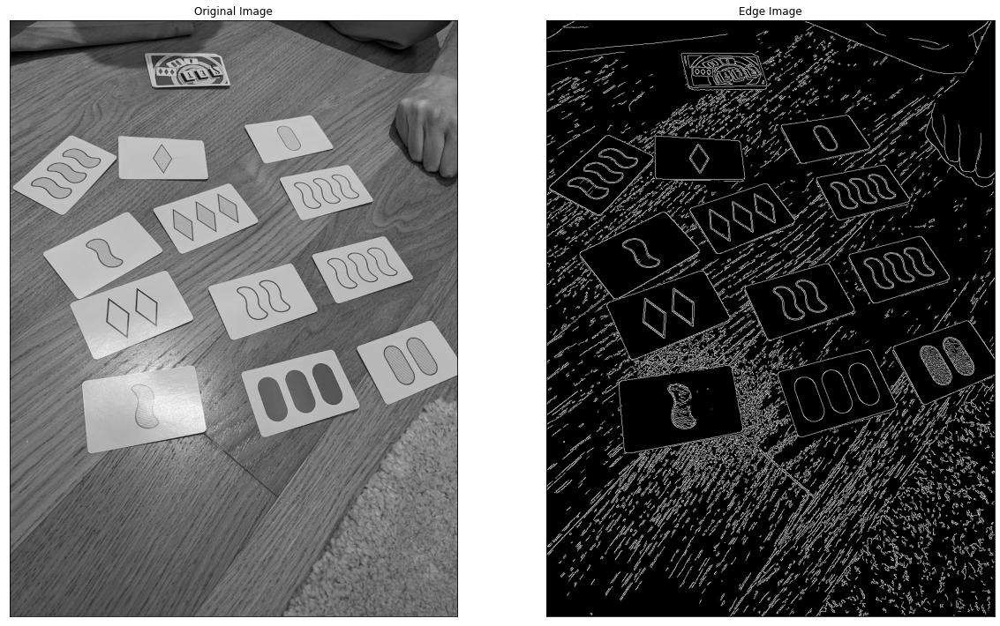

...

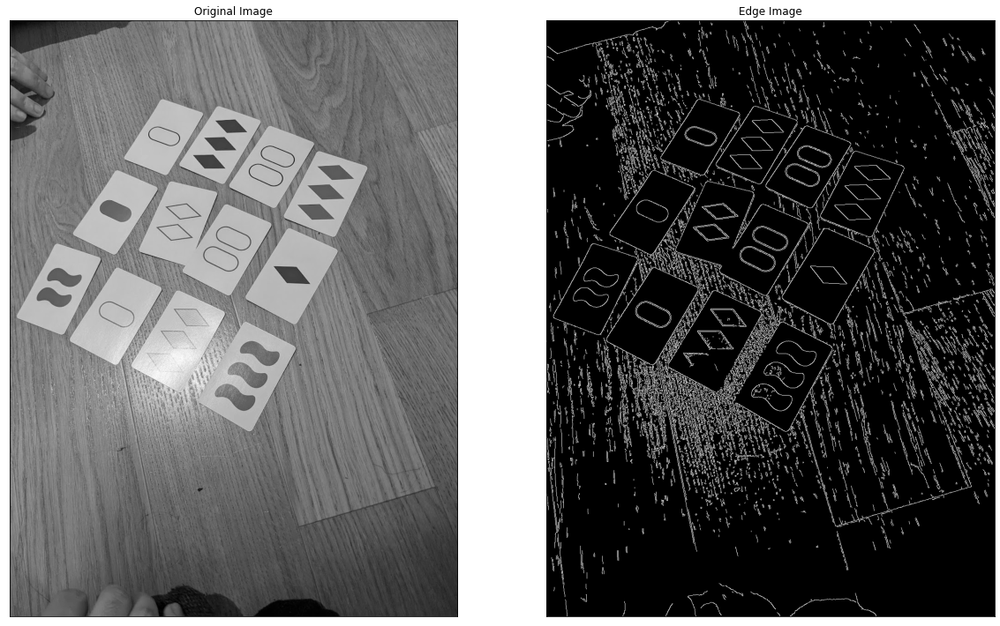

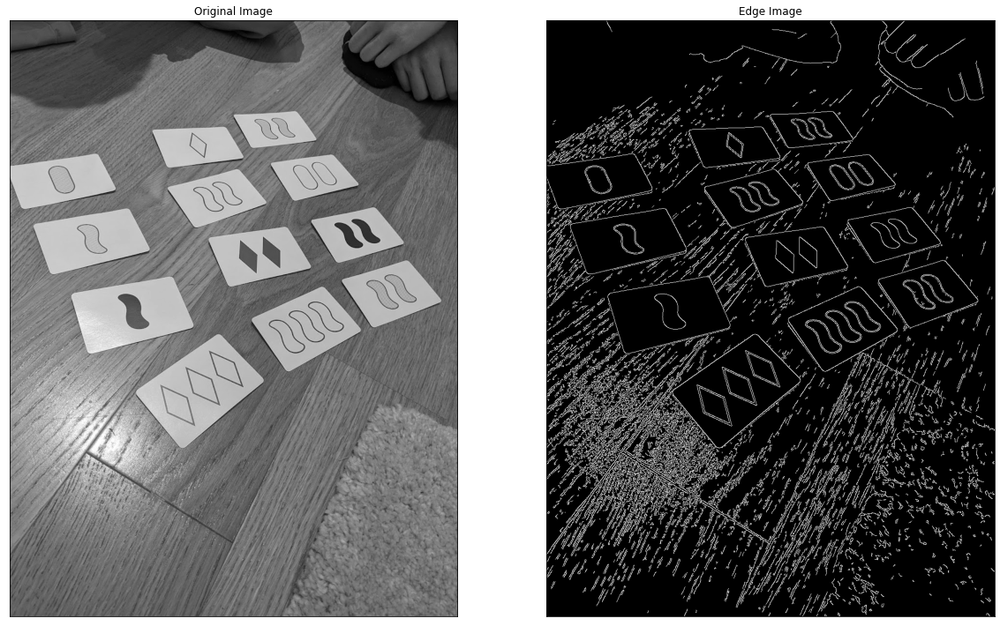

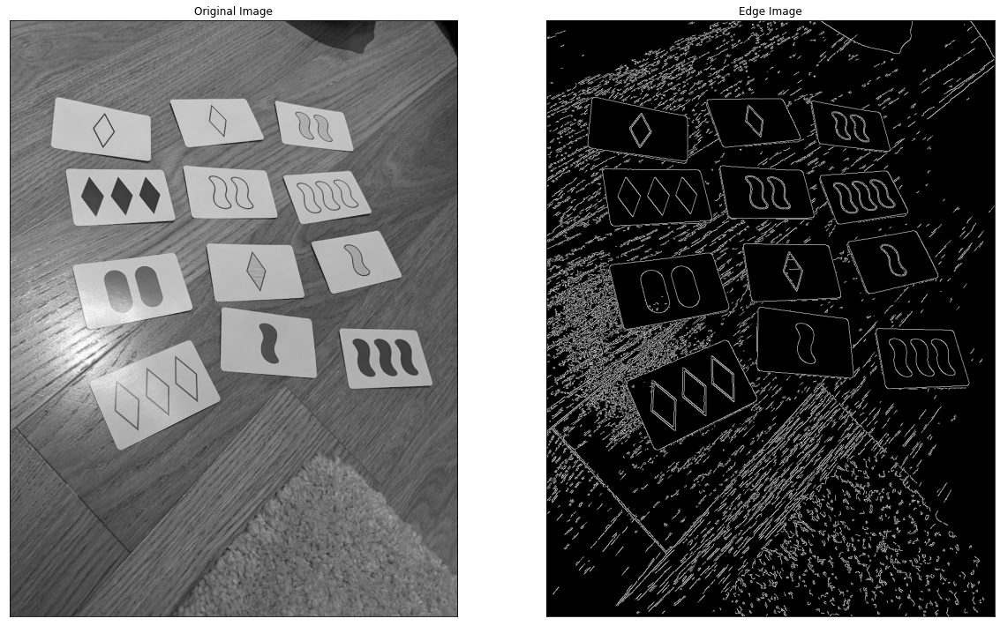

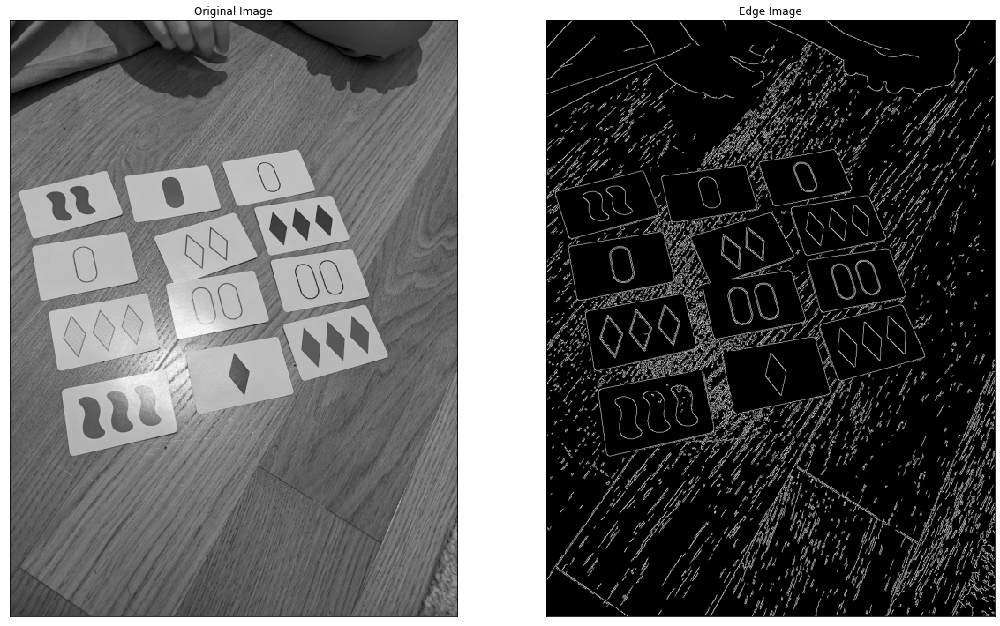

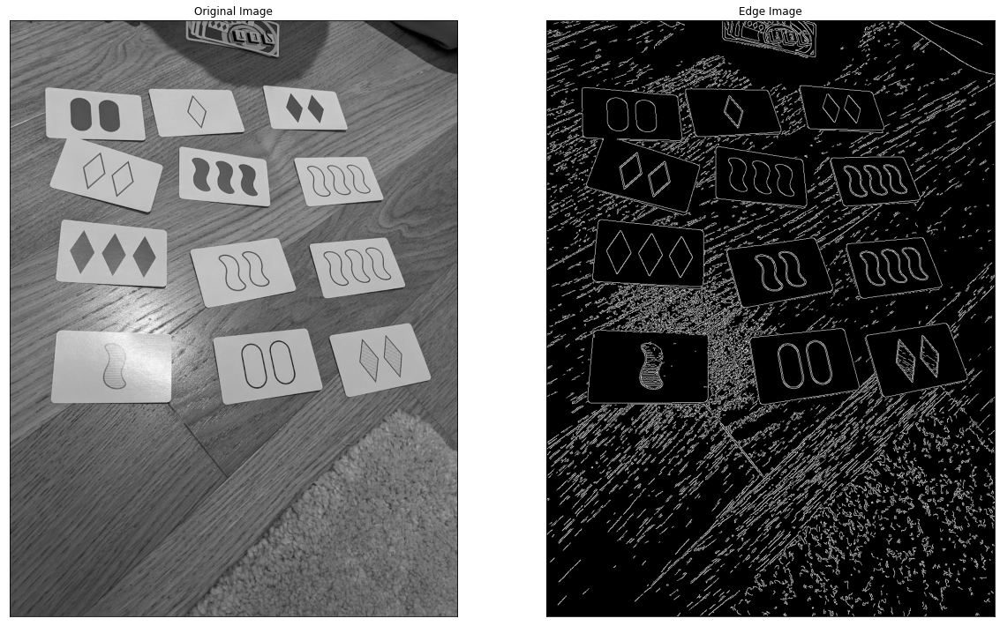

In [4]:
PATH = "pictures/PXL_20220223_020637682.MP.jpg"
def plot_edges(path):
    img = cv2.imread(path,0)
    edges = cv2.Canny(img,100,200)
    fig, ax = plt.subplots(1, 2, figsize=(20,20))
    ax[0].imshow(img,cmap = 'gray')
    ax[0].set_title('Original Image')
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].imshow(edges,cmap = 'gray')
    ax[1].set_title('Edge Image')
    ax[1].set_xticks([])
    ax[1].set_yticks([])

for file in os.listdir('pictures'):
    plot_edges(os.path.join('pictures', file))

23


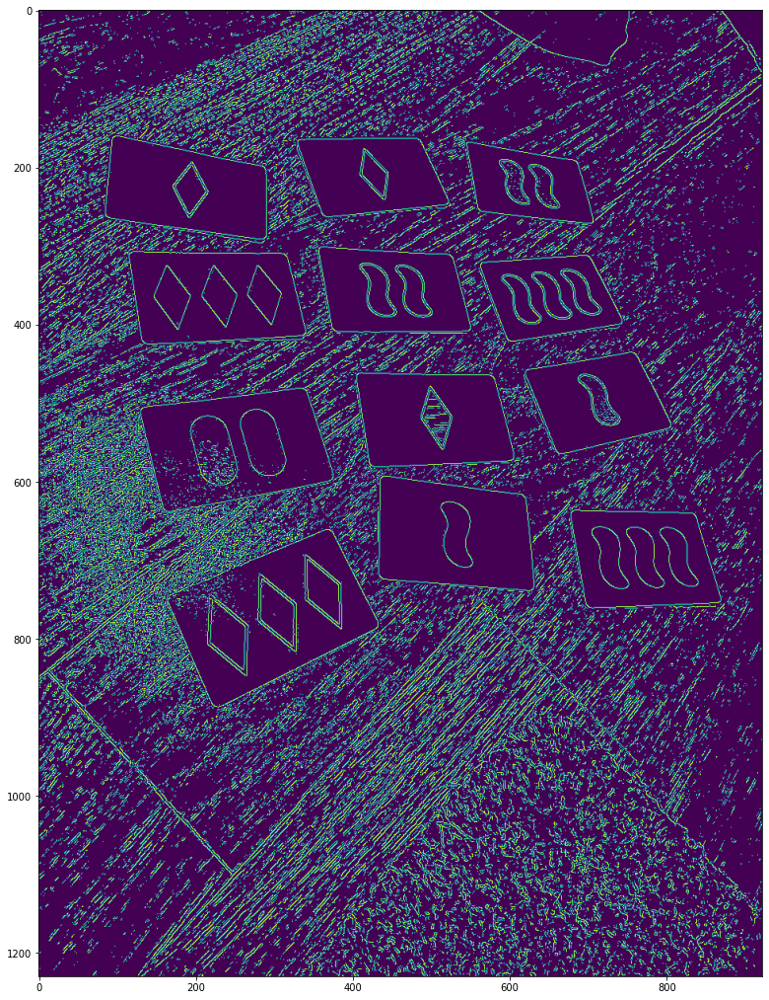

In [80]:
import cv2

def clahe(bgr):
    lab = cv2.cvtColor(bgr, cv2.COLOR_BGR2LAB)
    clahe = cv2.createCLAHE(clipLimit=2.0,tileGridSize=(8,8))
    lab[...,0] = clahe.apply(lab[...,0])
    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    return bgr


image = cv2.imread('pictures/PXL_20220223_020823192.MP.jpg')
# blur = cv2.pyrMeanShiftFiltering(image, 11, 21)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image = cv2.Canny(image, 100, 100)
# image = cv2.resize(image, (512, 512))
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
# thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV)[1]


cnts = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
cnts = [c for c in cnts if len(c) >= 200]
print(len(cnts))
# cv2.drawContours(image, cnts, -1, (0,255,0), 3)
fig, ax = plt.subplots(figsize=(18, 18))
ax.imshow(image)


# for c in cnts:
#     peri = cv2.arcLength(c, True)
#     approx = cv2.approxPolyDP(c, 0.015 * peri, True)
#     if len(approx) == 4:
#         x,y,w,h = cv2.boundingRect(approx)
#         cv2.rectangle(image,(x,y),(x+w,y+h),(36,255,12),2)
#     if len(approx) == 3:
#         print(approx)

# cv2.imshow('thresh', thresh)
# cv2.imshow('image', image)
# cv2.waitKey()

In [55]:
image.shape

(1230, 922)

In [6]:
import cv2
import numpy as np;

params = cv2.SimpleBlobDetector_Params()
params.blobColor = 255
params.maxArea = 5000*30
params.
# params.

ver = (cv2.__version__).split('.')
if int(ver[0]) < 3 :
    detector = cv2.SimpleBlobDetector(params)
else : 
    detector = cv2.SimpleBlobDetector_create(params)

im = cv2.imread("pictures/PXL_20220223_020637682.MP.jpg", cv2.IMREAD_GRAYSCALE)
# Detect blobs.
keypoints = detector.detect(im)
 
# Draw detected blobs as red circles.
# cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS ensures the size of the circle corresponds to the size of blob
im_with_keypoints = cv2.drawKeypoints(im, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
fig, ax = plt.subplots(figsize=(18, 18))
ax.imshow(im_with_keypoints)
# plt.show()

SyntaxError: invalid syntax (3441234599.py, line 7)

In [ ]:
from __future__ import print_function
import cv2 as cv
import numpy as np
import argparse
parser = argparse.ArgumentParser(description='Code for Feature Matching with FLANN tutorial.')
parser.add_argument('--input1', help='Path to input image 1.', default='box.png')
parser.add_argument('--input2', help='Path to input image 2.', default='box_in_scene.png')
args = parser.parse_args()
img_object = cv.imread(cv.samples.findFile(args.input1), cv.IMREAD_GRAYSCALE)
img_scene = cv.imread(cv.samples.findFile(args.input2), cv.IMREAD_GRAYSCALE)
if img_object is None or img_scene is None:
    print('Could not open or find the images!')
    exit(0)
#-- Step 1: Detect the keypoints using SURF Detector, compute the descriptors
minHessian = 400
detector = cv.xfeatures2d_SURF.create(hessianThreshold=minHessian)
keypoints_obj, descriptors_obj = detector.detectAndCompute(img_object, None)
keypoints_scene, descriptors_scene = detector.detectAndCompute(img_scene, None)
#-- Step 2: Matching descriptor vectors with a FLANN based matcher
# Since SURF is a floating-point descriptor NORM_L2 is used
matcher = cv.DescriptorMatcher_create(cv.DescriptorMatcher_FLANNBASED)
knn_matches = matcher.knnMatch(descriptors_obj, descriptors_scene, 2)
#-- Filter matches using the Lowe's ratio test
ratio_thresh = 0.75
good_matches = []
for m,n in knn_matches:
    if m.distance < ratio_thresh * n.distance:
        good_matches.append(m)
#-- Draw matches
img_matches = np.empty((max(img_object.shape[0], img_scene.shape[0]), img_object.shape[1]+img_scene.shape[1], 3), dtype=np.uint8)
cv.drawMatches(img_object, keypoints_obj, img_scene, keypoints_scene, good_matches, img_matches, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
#-- Localize the object
obj = np.empty((len(good_matches),2), dtype=np.float32)
scene = np.empty((len(good_matches),2), dtype=np.float32)
for i in range(len(good_matches)):
    #-- Get the keypoints from the good matches
    obj[i,0] = keypoints_obj[good_matches[i].queryIdx].pt[0]
    obj[i,1] = keypoints_obj[good_matches[i].queryIdx].pt[1]
    scene[i,0] = keypoints_scene[good_matches[i].trainIdx].pt[0]
    scene[i,1] = keypoints_scene[good_matches[i].trainIdx].pt[1]
H, _ =  cv.findHomography(obj, scene, cv.RANSAC)
#-- Get the corners from the image_1 ( the object to be "detected" )
obj_corners = np.empty((4,1,2), dtype=np.float32)
obj_corners[0,0,0] = 0
obj_corners[0,0,1] = 0
obj_corners[1,0,0] = img_object.shape[1]
obj_corners[1,0,1] = 0
obj_corners[2,0,0] = img_object.shape[1]
obj_corners[2,0,1] = img_object.shape[0]
obj_corners[3,0,0] = 0
obj_corners[3,0,1] = img_object.shape[0]
scene_corners = cv.perspectiveTransform(obj_corners, H)
#-- Draw lines between the corners (the mapped object in the scene - image_2 )
cv.line(img_matches, (int(scene_corners[0,0,0] + img_object.shape[1]), int(scene_corners[0,0,1])),\
    (int(scene_corners[1,0,0] + img_object.shape[1]), int(scene_corners[1,0,1])), (0,255,0), 4)
cv.line(img_matches, (int(scene_corners[1,0,0] + img_object.shape[1]), int(scene_corners[1,0,1])),\
    (int(scene_corners[2,0,0] + img_object.shape[1]), int(scene_corners[2,0,1])), (0,255,0), 4)
cv.line(img_matches, (int(scene_corners[2,0,0] + img_object.shape[1]), int(scene_corners[2,0,1])),\
    (int(scene_corners[3,0,0] + img_object.shape[1]), int(scene_corners[3,0,1])), (0,255,0), 4)
cv.line(img_matches, (int(scene_corners[3,0,0] + img_object.shape[1]), int(scene_corners[3,0,1])),\
    (int(scene_corners[0,0,0] + img_object.shape[1]), int(scene_corners[0,0,1])), (0,255,0), 4)
#-- Show detected matches
cv.imshow('Good Matches & Object detection', img_matches)
cv.waitKey()


In [ ]:
from __future__ import print_function
import cv2 as cv
import numpy as np
import argparse
parser = argparse.ArgumentParser(description='Code for Feature Matching with FLANN tutorial.')
parser.add_argument('--input1', help='Path to input image 1.', default='box.png')
parser.add_argument('--input2', help='Path to input image 2.', default='box_in_scene.png')
args = parser.parse_args()
img_object = cv.imread(cv.samples.findFile(args.input1), cv.IMREAD_GRAYSCALE)
img_scene = cv.imread(cv.samples.findFile(args.input2), cv.IMREAD_GRAYSCALE)
if img_object is None or img_scene is None:
    print('Could not open or find the images!')
    exit(0)
#-- Step 1: Detect the keypoints using SURF Detector, compute the descriptors
minHessian = 400
detector = cv.xfeatures2d_SURF.create(hessianThreshold=minHessian)
keypoints_obj, descriptors_obj = detector.detectAndCompute(img_object, None)
keypoints_scene, descriptors_scene = detector.detectAndCompute(img_scene, None)
#-- Step 2: Matching descriptor vectors with a FLANN based matcher
# Since SURF is a floating-point descriptor NORM_L2 is used
matcher = cv.DescriptorMatcher_create(cv.DescriptorMatcher_FLANNBASED)
knn_matches = matcher.knnMatch(descriptors_obj, descriptors_scene, 2)
#-- Filter matches using the Lowe's ratio test
ratio_thresh = 0.75
good_matches = []
for m,n in knn_matches:
    if m.distance < ratio_thresh * n.distance:
        good_matches.append(m)
#-- Draw matches
img_matches = np.empty((max(img_object.shape[0], img_scene.shape[0]), img_object.shape[1]+img_scene.shape[1], 3), dtype=np.uint8)
cv.drawMatches(img_object, keypoints_obj, img_scene, keypoints_scene, good_matches, img_matches, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
#-- Localize the object
obj = np.empty((len(good_matches),2), dtype=np.float32)
scene = np.empty((len(good_matches),2), dtype=np.float32)
for i in range(len(good_matches)):
    #-- Get the keypoints from the good matches
    obj[i,0] = keypoints_obj[good_matches[i].queryIdx].pt[0]
    obj[i,1] = keypoints_obj[good_matches[i].queryIdx].pt[1]
    scene[i,0] = keypoints_scene[good_matches[i].trainIdx].pt[0]
    scene[i,1] = keypoints_scene[good_matches[i].trainIdx].pt[1]
H, _ =  cv.findHomography(obj, scene, cv.RANSAC)
#-- Get the corners from the image_1 ( the object to be "detected" )
obj_corners = np.empty((4,1,2), dtype=np.float32)
obj_corners[0,0,0] = 0
obj_corners[0,0,1] = 0
obj_corners[1,0,0] = img_object.shape[1]
obj_corners[1,0,1] = 0
obj_corners[2,0,0] = img_object.shape[1]
obj_corners[2,0,1] = img_object.shape[0]
obj_corners[3,0,0] = 0
obj_corners[3,0,1] = img_object.shape[0]
scene_corners = cv.perspectiveTransform(obj_corners, H)
#-- Draw lines between the corners (the mapped object in the scene - image_2 )
cv.line(img_matches, (int(scene_corners[0,0,0] + img_object.shape[1]), int(scene_corners[0,0,1])),\
    (int(scene_corners[1,0,0] + img_object.shape[1]), int(scene_corners[1,0,1])), (0,255,0), 4)
cv.line(img_matches, (int(scene_corners[1,0,0] + img_object.shape[1]), int(scene_corners[1,0,1])),\
    (int(scene_corners[2,0,0] + img_object.shape[1]), int(scene_corners[2,0,1])), (0,255,0), 4)
cv.line(img_matches, (int(scene_corners[2,0,0] + img_object.shape[1]), int(scene_corners[2,0,1])),\
    (int(scene_corners[3,0,0] + img_object.shape[1]), int(scene_corners[3,0,1])), (0,255,0), 4)
cv.line(img_matches, (int(scene_corners[3,0,0] + img_object.shape[1]), int(scene_corners[3,0,1])),\
    (int(scene_corners[0,0,0] + img_object.shape[1]), int(scene_corners[0,0,1])), (0,255,0), 4)